In [1]:
import scanpy as sc
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import gseapy

In [2]:
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80, dpi_save= 300, fontsize=6, frameon=True, figsize=(3, 3), transparent=True, format="pdf")
sc.settings.verbosity = 3

-----
anndata     0.7.5
scanpy      1.8.1
sinfo       0.3.1
-----
OpenSSL             20.0.1
PIL                 8.1.1
anndata             0.7.5
anyio               NA
appdirs             1.4.4
argon2              20.1.0
asciitree           NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
beta_ufunc          NA
binom_ufunc         NA
bioservices         1.7.11
boto3               1.20.24
botocore            1.23.24
brotli              NA
bs4                 4.9.3
bson                NA
cairo               1.20.0
certifi             2021.10.08
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.3.0
colorama            0.4.4
colorlog            NA
cryptography        3.4.4
cycler              0.10.0
cython_runtime      NA
dask                2021.02.0
dateutil            2.8.1
decorator           4.4.2
docutils            0.16
easydev             0.11.0
fasteners           NA
future_fstrings     NA
google              NA
gridfs     

In [4]:
heart_infection_sc_no_viral_genes = sc.read_h5ad(filename="./../../../pyobjs_github/heart_infection_sc_new.h5ad")
heart_infection_sc_no_viral_genes

AnnData object with n_obs × n_vars = 31684 × 2247
    obs: 'sample', 'T1LReoS1', 'T1LReoS2', 'T1LReoS3', 'T1LReoS4', 'T1LReoM1', 'T1LReoM2', 'T1LReoM3', 'T1LReoL1', 'T1LReoL2', 'T1LReoL3', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'total_viral', 'pct_viral', 'stage', 'state', 'condition', 'n_genes', 'S_score', 'G2M_score', 'phase', 'umap_density_condition', 'leiden_0.5', 'leiden_0.3', 'leiden_0.1', 'celltypes_leiden_0.3', 'celltypes_leiden_0.5', 'celltype_groups'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'mean', 'std'
    uns: 'celltype_groups_colors', 'celltypes_leiden_0.5_colors', 'condition_colors', 'hvg', 'leiden', 'leiden_0.3_colors', 'leiden_0.5_colors', 'neighbors', 'pca', 'phase_colors', 'rank_genes_groups_celltypes_leiden_0.5', 'rank_genes_groups_leiden_0.3', 'rank_genes_gro

In [5]:
samples = ['Mock-Heart-D4PI', 'T1L-Heart-D4PI', 'Mock-Heart-D7PI', 'T1L-Heart-D7PI']

In [7]:
stage_data_visium = list()

for sample in samples:
    print(sample)
    data_visium = sc.read_visium(path="./../../../spatialData/" + sample + "/outs/")
    data_visium.var_names_make_unique()
    print(data_visium)
    
    reoviral_genes = [name for name in data_visium.var_names if name.startswith('Reo')]
    print(reoviral_genes)
    viral_expression = data_visium[:,reoviral_genes].to_df()
    viral_expression.columns = [x.split("_")[1] for x in viral_expression.columns]
    reoviral_genes_indicator = np.in1d(data_visium.var_names, reoviral_genes)
    data_visium_no_viral_genes = data_visium[:, ~reoviral_genes_indicator]
    data_visium_no_viral_genes.var_names = [name.split("_")[1] for name in data_visium_no_viral_genes.var_names]
    data_visium_no_viral_genes.obs.join(viral_expression.astype(int))
    print(data_visium_no_viral_genes.shape)

    data_visium_no_viral_genes.obs_names_make_unique()
    data_visium_no_viral_genes.var_names_make_unique()

    sc.pp.filter_cells(data_visium_no_viral_genes, min_counts=1)
    sc.pp.filter_genes(data_visium_no_viral_genes, min_cells=1)

    data_visium_no_viral_genes.var['mt'] = data_visium_no_viral_genes.var_names.str.startswith('mt-')  # annotate the group of mitochondrial genes as 'mt'
    sc.pp.calculate_qc_metrics(data_visium_no_viral_genes, qc_vars=['mt'], percent_top=None, log1p=False, inplace=True)

    sc.pp.normalize_total(data_visium_no_viral_genes, inplace=True)
    sc.pp.log1p(data_visium_no_viral_genes)

    data_visium_no_viral_genes.raw = data_visium_no_viral_genes
    print(data_visium_no_viral_genes.shape)
   
    sc.pp.scale(data_visium_no_viral_genes, max_value=10)
    sc.pp.pca(data_visium_no_viral_genes, svd_solver = "arpack", random_state=0)
    sc.pp.neighbors(data_visium_no_viral_genes, n_pcs=20)
    sc.tl.umap(data_visium_no_viral_genes)
    sc.tl.leiden(data_visium_no_viral_genes, key_added="leiden_0.5", resolution = 0.5)
    sc.tl.leiden(data_visium_no_viral_genes, key_added="leiden_0.8", resolution = 0.8)
    data_visium_no_viral_genes.obs["sample"] = sample
    
    stage_data_visium.append(data_visium_no_viral_genes)

Mock-Heart-D4PI
reading ../../../spatialData/Mock-Heart-D4PI/outs/filtered_feature_bc_matrix.h5


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 1835 × 54848
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
['ReoT1L_T1LReoS1', 'ReoT1L_T1LReoS2', 'ReoT1L_T1LReoS3', 'ReoT1L_T1LReoS4', 'ReoT1L_T1LReoM1', 'ReoT1L_T1LReoM2', 'ReoT1L_T1LReoM3', 'ReoT1L_T1LReoL1', 'ReoT1L_T1LReoL2', 'ReoT1L_T1LReoL3']
(1835, 54838)
filtered out 36181 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
(1835, 18657)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:09)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:14)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:04)
running Leiden c

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 1372 × 54848
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
['ReoT1L_T1LReoS1', 'ReoT1L_T1LReoS2', 'ReoT1L_T1LReoS3', 'ReoT1L_T1LReoS4', 'ReoT1L_T1LReoM1', 'ReoT1L_T1LReoM2', 'ReoT1L_T1LReoM3', 'ReoT1L_T1LReoL1', 'ReoT1L_T1LReoL2', 'ReoT1L_T1LReoL3']
(1372, 54838)
filtered out 37333 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
(1372, 17505)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:05)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:03)
running Leiden c

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 2758 × 54848
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
['ReoT1L_T1LReoS1', 'ReoT1L_T1LReoS2', 'ReoT1L_T1LReoS3', 'ReoT1L_T1LReoS4', 'ReoT1L_T1LReoM1', 'ReoT1L_T1LReoM2', 'ReoT1L_T1LReoM3', 'ReoT1L_T1LReoL1', 'ReoT1L_T1LReoL2', 'ReoT1L_T1LReoL3']
(2758, 54838)
filtered out 36492 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
(2758, 18346)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:13)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:06)
running Leiden c

Variable names are not unique. To make them unique, call `.var_names_make_unique`.


 (0:00:00)


Variable names are not unique. To make them unique, call `.var_names_make_unique`.


AnnData object with n_obs × n_vars = 2278 × 54848
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'
['ReoT1L_T1LReoS1', 'ReoT1L_T1LReoS2', 'ReoT1L_T1LReoS3', 'ReoT1L_T1LReoS4', 'ReoT1L_T1LReoM1', 'ReoT1L_T1LReoM2', 'ReoT1L_T1LReoM3', 'ReoT1L_T1LReoL1', 'ReoT1L_T1LReoL2', 'ReoT1L_T1LReoL3']
(2278, 54838)
filtered out 36885 genes that are detected in less than 1 cells
normalizing counts per cell
    finished (0:00:00)
(2278, 17953)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:10)
computing neighbors
    using 'X_pca' with n_pcs = 20
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:00)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:05)
running Leiden c

... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


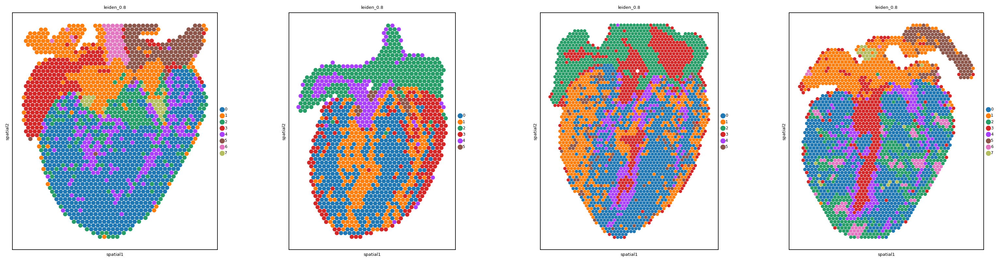

In [10]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
for i, library in enumerate(stage_data_visium):
    ad = library.copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=samples[i],
        color="leiden_0.8",
        size=1.5,
        scale_factor=1.0,
        show=False,
        ax=axs[i],
    )
plt.tight_layout()

In [11]:
stage_data_visium[0].write_h5ad(filename="./../../../pyobjs_github/Mock_heart_D4PI.h5ad")
stage_data_visium[1].write_h5ad(filename="./../../../pyobjs_github/T1L_heart_D4PI.h5ad")
stage_data_visium[2].write_h5ad(filename="./../../../pyobjs_github/Mock_heart_D7PI.h5ad")
stage_data_visium[3].write_h5ad(filename="./../../../pyobjs_github/T1L_heart_D7PI.h5ad")

... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'sample' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical
... storing 'feature_types' as categorical
... storing 'genome' as categorical


In [14]:
stage_data_visium = list()
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/Mock_heart_D4PI.h5ad"))
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/T1L_heart_D4PI.h5ad"))
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/Mock_heart_D7PI.h5ad"))
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/T1L_heart_D7PI.h5ad"))

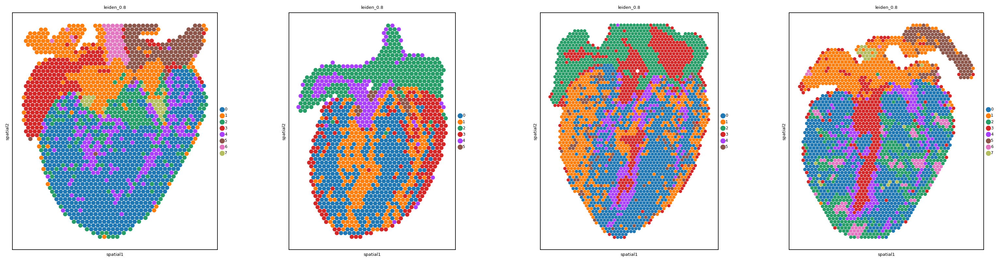

In [15]:
fig, axs = plt.subplots(1, 4, figsize=(20, 5))
for i, library in enumerate(stage_data_visium):
    ad = library.copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=samples[i],
        color="leiden_0.8",
        size=1.5,
        scale_factor=1.0,
        show=False,
        ax=axs[i],
    )
plt.tight_layout()

In [65]:
stage_data_visium[0].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[0].obs["leiden_0.8"]
anatomical_regions = {'0': "Ventricle", 
             '2': "Ventricle", 
             '1': "Chamber cavity",
             '7': "Valve", 
             '3': "Atria",
             '5': "Atria",
             '4': "Ventricle",
             '6': "Outflow tract"}
stage_data_visium[0].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[0].obs["anatomical_regions_leiden_0.8"].map(anatomical_regions).astype("category")
stage_data_visium[1].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[1].obs["leiden_0.8"]
anatomical_regions = {'0': "Inflamed ventricle", 
             '1': "Inflamed ventricle", 
             '2': "Inflamed atria", 
             '3': "Inflamed ventricle",
             '4': "Chamber cavity",
             '5': "Chamber cavity"}
stage_data_visium[1].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[1].obs["anatomical_regions_leiden_0.8"].map(anatomical_regions).astype("category")
stage_data_visium[2].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[2].obs["leiden_0.8"]
anatomical_regions = {'0': "Ventricle", 
             '1': "Ventricle", 
             '2': "Atria", 
             '3': "Chamber cavity",
             '4': "Ventricle",
             '5': "Ventricle"}
stage_data_visium[2].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[2].obs["anatomical_regions_leiden_0.8"].map(anatomical_regions).astype("category")
stage_data_visium[3].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[3].obs["leiden_0.8"]
anatomical_regions = {'0': "Inflamed ventricle", 
             '1': "Inflamed atria", 
             '2': "Border zone", 
             '3': "Chamber cavity",
             '4': "Inflamed ventricle",
             '5': "Inflamed atria",
             '6': "Myocarditic region",
             '7': "Outflow tract"}
stage_data_visium[3].obs["anatomical_regions_leiden_0.8"] = stage_data_visium[3].obs["anatomical_regions_leiden_0.8"].map(anatomical_regions).astype("category")

In [66]:
heart_infection_visium_no_viral_genes = stage_data_visium[0].concatenate(
    stage_data_visium[1], stage_data_visium[2], stage_data_visium[3],
    batch_key="sample", 
    uns_merge="unique",
    batch_categories=[
        k
        for d in [
            stage_data_visium[0].uns["spatial"],
            stage_data_visium[1].uns["spatial"],
            stage_data_visium[2].uns["spatial"],
            stage_data_visium[3].uns["spatial"],
        ]
        for k, v in d.items()
    ],
)

In [67]:
heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"] = heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"].astype("category")

In [68]:
heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"] = heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"].astype("category")
heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"].cat.reorder_categories(
    new_categories = ["Atria", 
                      "Ventricle",
                      "Inflamed atria", 
                      "Inflamed ventricle", 
                     "Myocarditic region",
                     "Border zone", "Outflow tract", "Valve", "Chamber cavity"], inplace = True)

<ipython-input-68-8d37843a2099>:2: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"].cat.reorder_categories(


... storing 'leiden_0.5' as categorical
... storing 'leiden_0.8' as categorical


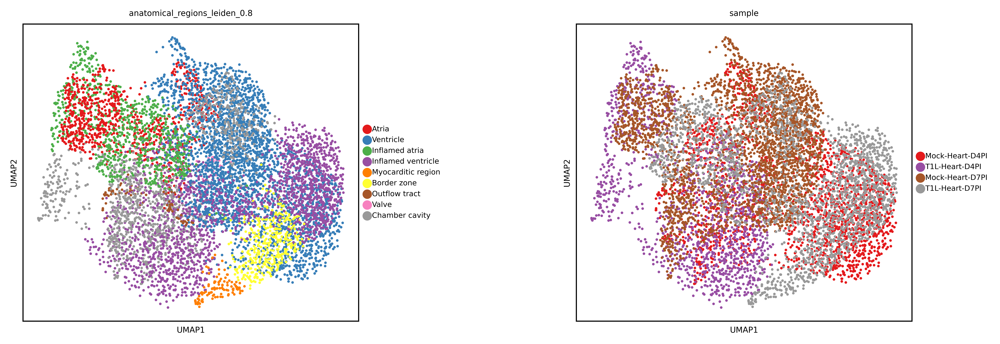

In [69]:
plt.rcParams["figure.figsize"] = (4, 4)
sc.pl.umap(heart_infection_visium_no_viral_genes, color=["anatomical_regions_leiden_0.8", "sample"], wspace=0.5, palette="Set1")


In [70]:
clusters_colors = dict(
    zip([str(i) for i in range(18)], heart_infection_visium_no_viral_genes.uns["anatomical_regions_leiden_0.8_colors"])
)
final_dict = dict(zip(list(heart_infection_visium_no_viral_genes.obs["anatomical_regions_leiden_0.8"].cat.categories), list(clusters_colors.values())))
final_dict
import pickle
with open('./../../../pyobjs_github/anatomical_reions_colors.pickle', 'wb') as handle:
    pickle.dump(final_dict, handle, protocol=pickle.HIGHEST_PROTOCOL)

/home/mm2937/miniconda3/envs/python385/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


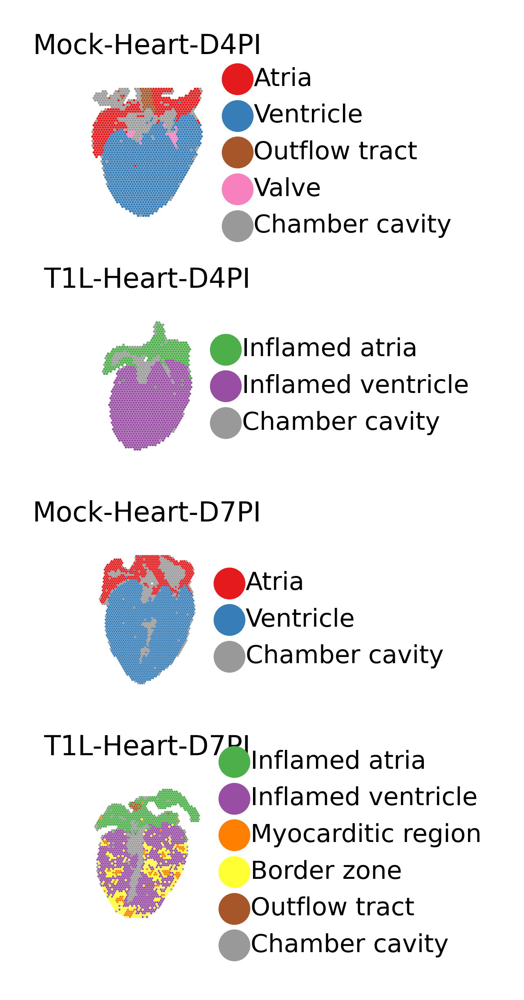

In [71]:
sc.settings.set_figure_params(dpi=400, dpi_save= 400, fontsize=6, frameon=True, figsize=(4.5, 4.5), transparent=True, vector_friendly = False, format="pdf")
fig, axs = plt.subplots(4, 1, figsize=(3,3))
for i, library in enumerate(samples):
    ad = heart_infection_visium_no_viral_genes[heart_infection_visium_no_viral_genes.obs["sample"] == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=library,
        color="anatomical_regions_leiden_0.8",
        palette=[
            v
            for k, v in clusters_colors.items()
            if k in ad.obs["anatomical_regions_leiden_0.8"].unique().tolist()
        ],
        size=1.5,
        scale_factor=0.6,
        show=False,
        ax=axs[i],
        frameon=False, 
        title=library, 
    )
# for i in range(3):
# axs[i].get_legend().set_visible(False)
# plt.legend(prop={'size': 6}, handletextpad=0.5, markerscale = 0.6, frameon = False, labelspacing = 0.2)
plt.tight_layout()
plt.savefig("./figures/spatial_maps.pdf", facecolor='w', edgecolor='w',
        format="pdf",  transparent=True)

In [72]:
stage_data_visium[0].write_h5ad(filename="./../../../pyobjs_github/Mock_heart_D4PI.h5ad")
stage_data_visium[1].write_h5ad(filename="./../../../pyobjs_github/T1L_heart_D4PI.h5ad")
stage_data_visium[2].write_h5ad(filename="./../../../pyobjs_github/Mock_heart_D7PI.h5ad")
stage_data_visium[3].write_h5ad(filename="./../../../pyobjs_github/T1L_heart_D7PI.h5ad")

In [74]:
stage_data_visium = list()
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/Mock_heart_D4PI.h5ad"))
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/T1L_heart_D4PI.h5ad"))
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/Mock_heart_D7PI.h5ad"))
stage_data_visium.append(sc.read_h5ad(filename="./../../../pyobjs_github/T1L_heart_D7PI.h5ad"))

In [75]:
heart_infection_visium_no_viral_genes = stage_data_visium[0].concatenate(
    stage_data_visium[1], stage_data_visium[2], stage_data_visium[3],
    batch_key="sample", 
    uns_merge="unique",
    batch_categories=[
        k
        for d in [
            stage_data_visium[0].uns["spatial"],
            stage_data_visium[1].uns["spatial"],
            stage_data_visium[2].uns["spatial"],
            stage_data_visium[3].uns["spatial"],
        ]
        for k, v in d.items()
    ],
)

In [76]:
heart_infection_visium_no_viral_genes

AnnData object with n_obs × n_vars = 8243 × 15524
    obs: 'in_tissue', 'array_row', 'array_col', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden_0.5', 'leiden_0.8', 'sample', 'anatomical_regions_leiden_0.8'
    var: 'gene_ids', 'feature_types', 'genome', 'mt', 'n_cells-Mock-Heart-D4PI', 'n_cells_by_counts-Mock-Heart-D4PI', 'mean_counts-Mock-Heart-D4PI', 'pct_dropout_by_counts-Mock-Heart-D4PI', 'total_counts-Mock-Heart-D4PI', 'mean-Mock-Heart-D4PI', 'std-Mock-Heart-D4PI', 'n_cells-Mock-Heart-D7PI', 'n_cells_by_counts-Mock-Heart-D7PI', 'mean_counts-Mock-Heart-D7PI', 'pct_dropout_by_counts-Mock-Heart-D7PI', 'total_counts-Mock-Heart-D7PI', 'mean-Mock-Heart-D7PI', 'std-Mock-Heart-D7PI', 'n_cells-T1L-Heart-D4PI', 'n_cells_by_counts-T1L-Heart-D4PI', 'mean_counts-T1L-Heart-D4PI', 'pct_dropout_by_counts-T1L-Heart-D4PI', 'total_counts-T1L-Heart-D4PI', 'mean-T1L-Heart-D4PI', 'std-T1L-Heart-D4PI', 'n_cells-T1L-Heart-D7PI', 'n_cells_by_counts-T1L-Heart-

In [77]:
heart_infection_visium_no_viral_genes.write_h5ad(filename="./../../../pyobjs_github/heart_infection_visium_no_viral_genes.h5ad")

... storing 'leiden_0.5' as categorical
... storing 'leiden_0.8' as categorical
... storing 'anatomical_regions_leiden_0.8' as categorical


In [78]:
sc.tl.rank_genes_groups(heart_infection_visium_no_viral_genes, 'anatomical_regions_leiden_0.8', method='wilcoxon', key_added='rank_genes_groups_anatomical_regions_leiden_0.8')
sc.tl.dendrogram(heart_infection_visium_no_viral_genes, "anatomical_regions_leiden_0.8", n_pcs=20)

ranking genes
    finished: added to `.uns['rank_genes_groups_anatomical_regions_leiden_0.8']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:09)
    using 'X_pca' with n_pcs = 20
Storing dendrogram info using `.uns['dendrogram_anatomical_regions_leiden_0.8']`


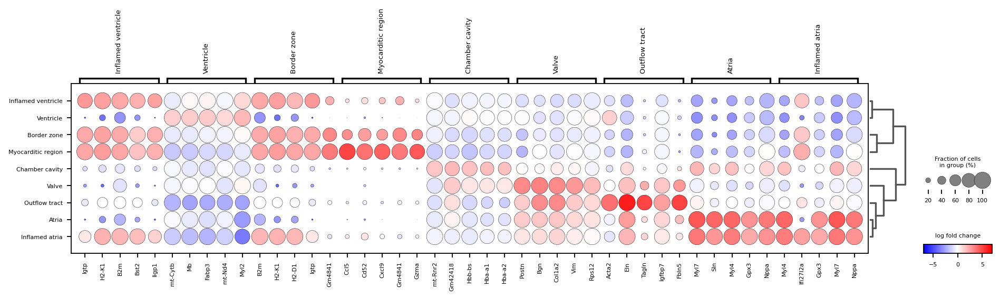

In [79]:
sc.settings.set_figure_params(dpi=80, dpi_save= 600, fontsize=6, frameon=True, figsize=(3, 3), transparent=True, vector_friendly = False, format="pdf")
fig, ax = plt.subplots(figsize = (14,3.5))
sc.pl.rank_genes_groups_dotplot(heart_infection_visium_no_viral_genes, n_genes=5, key="rank_genes_groups_anatomical_regions_leiden_0.8", values_to_plot='logfoldchanges', min_logfoldchange=1.0, vmax=7, vmin=-7, cmap='bwr', show=False, ax=ax)
# plt.tight_layout()
plt.savefig("./figures/anatomical_dotplot.pdf")

In [51]:
day4_WT_infection_markers = pd.read_csv("./../../../csvs_github/heart_IFN_genelist_D4PI.csv")
day4_WT_infection_markers_significant = day4_WT_infection_markers[day4_WT_infection_markers["logfoldchanges"] > 1.0]
day4_WT_infection_markers_significant = day4_WT_infection_markers_significant[day4_WT_infection_markers_significant["pvals_adj"] < 0.01]
print(day4_WT_infection_markers_significant)

     Unnamed: 0     names     scores  logfoldchanges     pvals  pvals_adj
0             0    Ifitm3  85.555220        3.635777  0.000000   0.000000
1             1      Bst2  84.066870        5.022720  0.000000   0.000000
2             3     Isg15  79.678000        6.908294  0.000000   0.000000
3             4       B2m  77.476456        3.591180  0.000000   0.000000
4             5  Ifi27l2a  60.614697        5.020513  0.000000   0.000000
..          ...       ...        ...             ...       ...        ...
918         920    Lgals3   3.483982        1.393968  0.000494   0.007769
919         921       Tnf   3.480584        1.848132  0.000500   0.007863
923         925    H2-T24   3.471297        3.921334  0.000518   0.008107
941         943    H2-Eb1   3.425932        1.714389  0.000613   0.009389
944         946      Oas3   3.416467        5.822568  0.000634   0.009683

[230 rows x 6 columns]


In [57]:
sc.tl.score_genes(heart_infection_visium_no_viral_genes, day4_WT_infection_markers_significant["names"], use_raw=True, score_name = 'Infection_response_score')

computing score 'Infection_response_score'
    finished: added
    'Infection_response_score', score of gene set (adata.obs).
    1079 total control genes are used. (0:00:00)


/home/mm2937/miniconda3/envs/python385/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2631: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


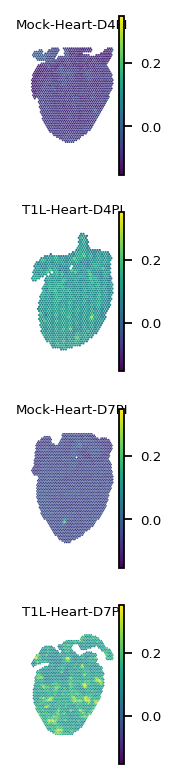

In [60]:
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize= (2,2.5), facecolor='white', frameon=True, vector_friendly = False, transparent=True, format="pdf")
fig, axs = plt.subplots(4, 1, figsize=(1.0,5))
for i, library in enumerate(samples):
    ad = heart_infection_visium_no_viral_genes[heart_infection_visium_no_viral_genes.obs["sample"] == library, :].copy()
    sc.pl.spatial(
        ad,
        img_key="hires",
        library_id=samples[i],
        color="Infection_response_score",
        size=1.5,
        scale_factor=1.0,
        show=False,
        ax=axs[i],
        frameon=False, clim=(np.min(heart_infection_visium_no_viral_genes.obs["Infection_response_score"]), np.max(heart_infection_visium_no_viral_genes.obs["Infection_response_score"])), title=samples[i]
    )
plt.tight_layout()
plt.savefig("figures/spatial_IFN.pdf", facecolor='w', edgecolor='w',
        orientation='potrait', format="pdf",
        transparent=True, metadata=None)

In [81]:
T1L_heart_D7PI = sc.read_h5ad(filename="./../../../pyobjs_github/T1L_heart_D7PI.h5ad")

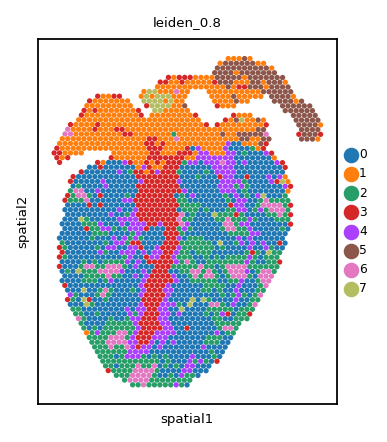

In [83]:
sc.pl.spatial(
        T1L_heart_D7PI,
        img_key="hires",
        color="leiden_0.8",
        size=1.5,
        scale_factor=1.0,
)

In [85]:
sc.tl.rank_genes_groups(T1L_heart_D7PI, 'leiden_0.8', method='wilcoxon', key_added='rank_genes_groups_leiden_0.8')

ranking genes
    finished: added to `.uns['rank_genes_groups_leiden_0.8']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:00:03)


In [86]:
iz_markers = sc.get.rank_genes_groups_df(T1L_heart_D7PI, key='rank_genes_groups_leiden_0.8', group = ["6"])
bz_markers = sc.get.rank_genes_groups_df(T1L_heart_D7PI, key='rank_genes_groups_leiden_0.8', group = ["2"])
iz_markers.to_csv("./../../../csvs_github/iz_markers_d7pi.csv", index = False)
bz_markers.to_csv("./../../../csvs_github/bz_markers_d7pi.csv", index = False)

In [87]:
bz_markers[1:50]

,names,scores,logfoldchanges,pvals,pvals_adj
1,Hspb7,9.960690,0.725322,2.264844e-23,1.351259e-19
2,mt-Cytb,9.543439,0.456415,1.381729e-21,3.543739e-18
3,Gzma,9.355874,1.270423,8.291124e-21,1.860632e-17
4,Actc1,9.307095,0.334101,1.313770e-20,2.620679e-17
5,Ly6c1,9.280763,0.994440,1.682694e-20,3.020940e-17
6,Tnnt2,8.783194,0.354076,1.588974e-18,2.593350e-15
7,Cd52,8.663015,0.913573,4.594457e-18,6.873690e-15
8,Igtp,8.419458,0.651090,3.782274e-17,5.223321e-14
9,Saa3,8.400468,2.153386,4.447042e-17,5.501996e-14
10,Tmsb4x,8.388988,0.394748,4.903467e-17,5.501996e-14


In [88]:
de_results = iz_markers
de_results = de_results[(de_results["logfoldchanges"] > 0.5) & (de_results["pvals_adj"] < 0.01)]
glist = de_results['names'].squeeze().str.strip().tolist()
print(len(glist))

296


In [89]:
# GO_Biological_Process_2021, KEGG_2019_Mouse, WikiPathways_2019_Mouse
enr_res = gseapy.enrichr(gene_list=glist, 
                     organism='Mouse',
                     gene_sets=['GO_Biological_Process_2021'],
                     description='pathway', 
                     cutoff = 0.01)

Connecting to Enrichr Server to get latest library names
Analysis name: pathway, Enrichr Library: GO_Biological_Process_2021
Save file of enrichment results: Job Id:9b7917743f079cc14f8d3cd1355d73f0
Done.



In [90]:
enr_res.results[1:50]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
1,GO_Biological_Process_2021,cotranslational protein targeting to membrane ...,36/94,8.925991e-42,9.640070e-39,0,0,46.900265,4432.994621,RPL4;RPL5;ARL6IP1;RPL32;RPL12;RPL11;RPL9;RPS15...
2,GO_Biological_Process_2021,cytoplasmic translation (GO:0002181),35/93,2.609862e-40,1.879100e-37,0,0,45.422777,4140.018436,RPL4;EIF4A1;RPL5;RPL32;RPL12;RPL11;RPL9;RPS15A...
3,GO_Biological_Process_2021,protein targeting to ER (GO:0045047),35/103,1.863443e-38,1.006259e-35,0,0,38.723236,3364.112435,RPL4;RPL5;RPL32;RPL12;RPL11;RPL9;RPS15A;RPS19;...
4,GO_Biological_Process_2021,"nuclear-transcribed mRNA catabolic process, no...",34/113,2.689310e-35,1.161782e-32,0,0,32.237414,2566.136655,RPL4;RPL5;RPL32;RPL12;RPL11;RPL9;RPS15A;RPS19;...
5,GO_Biological_Process_2021,peptide biosynthetic process (GO:0043043),34/162,1.831044e-29,6.591757e-27,0,0,19.846851,1313.267760,RPL4;RPL5;RPL32;RPL12;RPL11;RPL9;RPS15A;RPS19;...
6,GO_Biological_Process_2021,nuclear-transcribed mRNA catabolic process (GO...,34/171,1.265922e-28,3.906274e-26,0,0,18.534518,1190.594102,RPL4;RPL5;RPL32;RPL12;RPL11;RPL9;RPS15A;RPS19;...
7,GO_Biological_Process_2021,translation (GO:0006412),35/214,2.170644e-26,5.860740e-24,0,0,14.627346,864.361912,RPL4;RPL5;RPL32;RPL12;RPL11;RPL9;RPS15A;RPS19;...
8,GO_Biological_Process_2021,cytokine-mediated signaling pathway (GO:0019221),52/621,1.480692e-24,3.553661e-22,0,0,7.166873,393.242979,IFITM3;CXCL9;ITGB2;IFI30;IFIT3;ICAM1;PSMD4;TMS...
9,GO_Biological_Process_2021,cellular protein metabolic process (GO:0044267),43/417,6.554889e-24,1.415856e-21,0,0,8.784321,468.923127,RPL4;RPL5;RPL32;UBA7;RPL12;RPL11;TNC;RPL9;C3;L...
10,GO_Biological_Process_2021,gene expression (GO:0010467),38/356,9.828226e-22,1.929906e-19,0,0,8.978938,434.325725,RPL4;RPL5;RPL32;RPL12;RPL11;RPL9;RBM3;RPS15A;R...


In [91]:
de_results = bz_markers
de_results = de_results[(de_results["logfoldchanges"] > 0.5) & (de_results["pvals_adj"] < 0.01)]
glist = de_results['names'].squeeze().str.strip().tolist()
print(len(glist))

75


In [92]:
# GO_Biological_Process_2021, KEGG_2019_Mouse, WikiPathways_2019_Mouse
enr_res = gseapy.enrichr(gene_list=glist, 
                     organism='Mouse',
                     gene_sets=['GO_Biological_Process_2021'],
                     description='pathway', 
                     cutoff = 0.01)

Connecting to Enrichr Server to get latest library names
Analysis name: pathway, Enrichr Library: GO_Biological_Process_2021
Save file of enrichment results: Job Id:f8289af032914e94bed525d614dde843
Done.



In [93]:
enr_res.results[1:50]

,Gene_set,Term,Overlap,P-value,Adjusted P-value,Old P-value,Old Adjusted P-value,Odds Ratio,Combined Score,Genes
1,GO_Biological_Process_2021,regulation of cellular ketone metabolic proces...,7/64,4.100064e-09,0.000002,0,0,35.881321,692.949519,PSMA3;PSMC5;PSMA4;PDK4;PSME1;PSMB10;PSMB8
2,GO_Biological_Process_2021,cytokine-mediated signaling pathway (GO:0019221),15/621,8.265411e-09,0.000002,0,0,7.969884,148.329006,HSPA9;CXCL9;IFI35;PSMB10;IFIT3;PSMB8;PSMC5;PSM...
3,GO_Biological_Process_2021,antigen processing and presentation of exogeno...,7/73,1.046941e-08,0.000002,0,0,30.974376,569.148218,PSMA3;PSMC5;PSMA4;PSME1;CD36;PSMB10;PSMB8
4,GO_Biological_Process_2021,antigen processing and presentation of exogeno...,7/78,1.672469e-08,0.000003,0,0,28.785833,515.450046,PSMC5;PSMA3;PSMA4;PSME1;CD36;PSMB10;PSMB8
5,GO_Biological_Process_2021,regulation of cellular amine metabolic process...,6/51,3.572878e-08,0.000006,0,0,38.415459,658.721762,PSMA3;PSMC5;PSMA4;PSME1;PSMB10;PSMB8
6,GO_Biological_Process_2021,cellular response to tumor necrosis factor (GO...,9/194,4.565053e-08,0.000006,0,0,14.550369,245.933975,PSMC5;PSMA3;PSMA4;CCL5;ANKRD1;PSME1;CCL2;PSMB1...
7,GO_Biological_Process_2021,regulation of cellular amino acid metabolic pr...,6/54,5.078557e-08,0.000006,0,0,36.009058,604.795664,PSMA3;PSMC5;PSMA4;PSME1;PSMB10;PSMB8
8,GO_Biological_Process_2021,negative regulation of mitotic cell cycle phas...,7/92,5.319434e-08,0.000006,0,0,24.027682,402.447181,PSMC5;PSMA3;PSMA4;PSME1;CCL2;PSMB10;PSMB8
9,GO_Biological_Process_2021,interleukin-1-mediated signaling pathway (GO:0...,7/94,6.178338e-08,0.000006,0,0,23.472955,389.642396,PSMC5;PSMA3;PSMA4;PSME1;SQSTM1;PSMB10;PSMB8
10,GO_Biological_Process_2021,negative regulation of cell cycle G2/M phase t...,6/57,7.072547e-08,0.000006,0,0,33.885763,557.910792,PSMA3;PSMC5;PSMA4;PSME1;PSMB10;PSMB8


(932, 11)


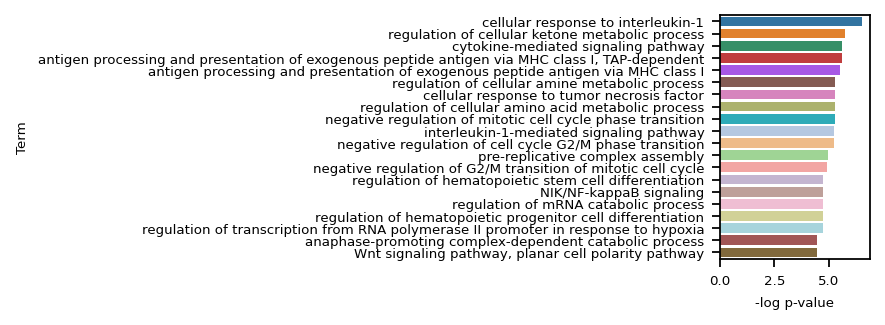

In [95]:
GO_results = enr_res.results
GO_results["-log p-value"] =  -1 * np.log10(GO_results["Adjusted P-value"]) 
GO_results["Term"] = [x.split(" (")[0] for x in GO_results["Term"]]
print(GO_results.shape)

sc.settings.set_figure_params(dpi_save= 400, fontsize=6, facecolor='white', frameon=True, transparent=True, format="pdf")
fig, ax = plt.subplots(figsize=(1.2,2.0))
plt.rc('font', size=6)
ax.set_axisbelow(True)
plt.grid(b=None)
g = sns.barplot(y = "Term", x = "-log p-value", data= GO_results[0:20], ax=ax)
plt.savefig("figures/go_enrich_bz_genes.pdf", facecolor='w', edgecolor='w',
        orientation='potrait', format="pdf",
        transparent=True, metadata=None)

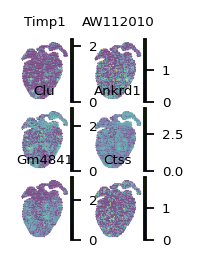

In [59]:
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize=(0.5,0.5), facecolor='white', frameon=True, transparent=True, vector_friendly = False, format="pdf")
sc.pl.spatial(T1L_heart_D7PI, color= ["Timp1", "AW112010", "Clu", "Ankrd1", "Gm4841", "Ctss"], ncols=2, frameon=False, 
              size=1.5, scale_factor=1.0, hspace=0.1, wspace=0.1, save="spatial_ge_bz.pdf")

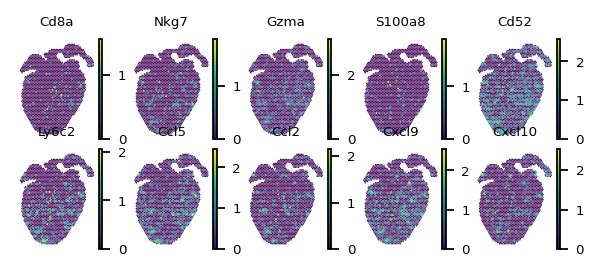

In [88]:
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize=(0.8,0.8), facecolor='white', frameon=True, transparent=True, vector_friendly = False, format="pdf")
sc.pl.spatial(T1L_heart_D7PI, color= ["Cd8a", "Nkg7", "Gzma", "S100a8", "Cd52", "Ly6c2", "Ccl5", "Ccl2", "Cxcl9", "Cxcl10"], ncols=5, frameon=False, 
              size=1.5, scale_factor=1.0, hspace=0.1, wspace=0.1, save="spatial_ge_iz.pdf")

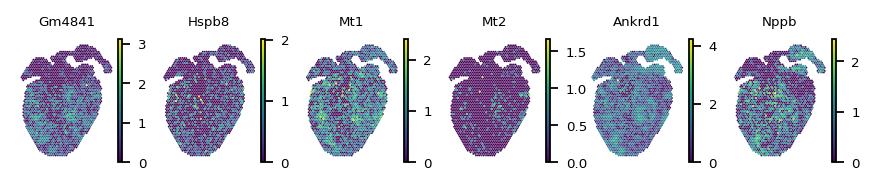

In [104]:
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize=(1.0,1.0), facecolor='white', frameon=True, transparent=True, vector_friendly = False, format="pdf")
sc.pl.spatial(T1L_heart_D7PI, color= ["Gm4841", "Hspb8", "Mt1", "Mt2", "Ankrd1", "Nppb"], ncols=6, frameon=False, 
              size=1.5, scale_factor=1.0, hspace=0.3, wspace=0.1, save="spatial_myocyte_ge_bz2.pdf")

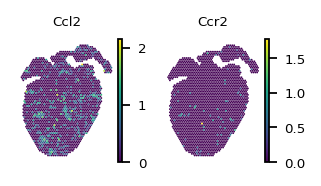

In [98]:
sc.settings.set_figure_params(dpi_save= 400, fontsize=6, figsize=(1.0,1.0), facecolor='white', frameon=True, transparent=True, vector_friendly = False, format="pdf")
sc.pl.spatial(T1L_heart_D7PI, color= ["Ccl2", "Ccr2"], ncols=3, frameon=False, 
              size=1.5, scale_factor=1.0, hspace=0.3, wspace=0.1, save="spatial_ccl2ccr2_ge.pdf")

In [99]:
heart_infection_sc = sc.read_h5ad(filename="./../../../pyobjs_github/heart_infection_sc_new.h5ad")

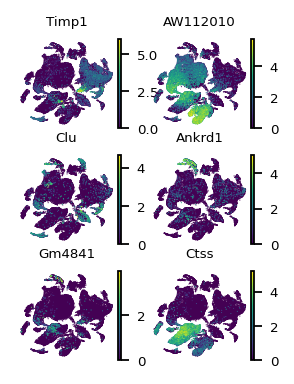

In [103]:
sc.settings.set_figure_params(dpi_save= 600, fontsize=6, figsize= (0.8,0.8), facecolor='white', frameon=True, vector_friendly = True, transparent=True, format="pdf")
sc.pl.umap(heart_infection_sc, color=  ["Timp1", "AW112010", "Clu", "Ankrd1", "Gm4841", "Ctss"], size=1.0, hspace=0.3, wspace=0.2, ncols=2, frameon=False, save = "bz_sc_se.pdf")

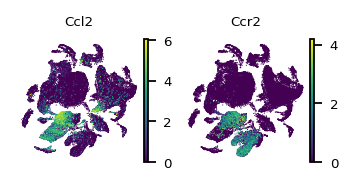

In [101]:
sc.settings.set_figure_params(dpi_save= 600, fontsize=6, figsize= (1.0,1.0), facecolor='white', frameon=True, vector_friendly = True, transparent=True, format="pdf")
sc.pl.umap(heart_infection_sc, color= ["Ccl2", "Ccr2"], size=1.0, hspace=0.2, wspace=0.2, ncols=2, frameon=False, save = "ccl2ccr2_sc_exp.pdf")